# Exploratory Data Analysis: YUL Flights & Weather (Processed)

## 1. Initialize Notebook

### 1.1 Import Necessary Libraries

In [14]:
#Import libraries for EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport
import ipywidgets as widgets



### 1.3 Load Processed DataFrame

* Using resulting dataset from [preproceess-pipeline.ipynb](https://github.com/McGill-MMA-EnterpriseAnalytics/INSY695-W24-078-Group-2/blob/53505af74aa8c55dd4b8ebfeba9fc17bc94168d0/preprocess-pipeline.ipynb)

In [2]:
df = pd.read_csv('final-weather-flight-data\processed_dataset_YUL-Flights-Weather.csv')

### 1.3 Acquaint self with datasets

#### Processed

In [3]:
df.head()

,Departure Delay (min),Temperature,Feels Like,Pressure,Humidity,Wind Speed,Wind Degree,Clouds,Rain 1h,Snow 1h,Departure Gate,Arrival IATA Code,Airline Name,Weather Main,Departure Time of Day,Weekday of Departure,Weather Severity
0,-0.175553,-0.592618,-0.456049,0.639606,-1.823912,-0.665222,-1.503404,-1.81669,-0.198237,-0.178731,43.0,117.0,1.0,1.0,1.0,0.0,1.0
1,0.124795,-0.592618,-0.456049,0.639606,-1.823912,-0.665222,-1.503404,-1.81669,-0.198237,-0.178731,45.0,38.0,44.0,1.0,1.0,0.0,1.0
2,-0.866354,-0.592618,-0.456049,0.639606,-1.823912,-0.665222,-1.503404,-1.81669,-0.198237,-0.178731,38.0,5.0,10.0,1.0,1.0,0.0,1.0
3,2.587649,-0.592618,-0.456049,0.639606,-1.823912,-0.665222,-1.503404,-1.81669,-0.198237,-0.178731,30.0,261.0,33.0,1.0,1.0,0.0,1.0
4,0.034690,-0.592618,-0.456049,0.639606,-1.823912,-0.665222,-1.503404,-1.81669,-0.198237,-0.178731,41.0,261.0,95.0,1.0,1.0,0.0,1.0


#### Processed

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30135 entries, 0 to 30134
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Departure Delay (min)  30135 non-null  float64
 1   Temperature            30135 non-null  float64
 2   Feels Like             30135 non-null  float64
 3   Pressure               30135 non-null  float64
 4   Humidity               30135 non-null  float64
 5   Wind Speed             30135 non-null  float64
 6   Wind Degree            30135 non-null  float64
 7   Clouds                 30135 non-null  float64
 8   Rain 1h                30135 non-null  float64
 9   Snow 1h                30135 non-null  float64
 10  Departure Gate         30135 non-null  float64
 11  Arrival IATA Code      30135 non-null  float64
 12  Airline Name           30135 non-null  float64
 13  Weather Main           30135 non-null  float64
 14  Departure Time of Day  30135 non-null  float64
 15  We

In [5]:
df.describe()

,Departure Delay (min),Temperature,Feels Like,Pressure,Humidity,Wind Speed,Wind Degree,Clouds,Rain 1h,Snow 1h,Departure Gate,Arrival IATA Code,Airline Name,Weather Main,Departure Time of Day,Weekday of Departure,Weather Severity
count,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,3.013500e+04,30135.000000,30135.000000,30135.000000,30135.000000,30135.000000,30135.000000,30135.000000
mean,1.697663e-17,-7.545169e-18,-1.509034e-17,-4.379971e-15,-2.112647e-16,1.395856e-16,-1.433582e-16,-1.584486e-16,2.452180e-17,-3.395326e-17,45.351385,156.923975,54.617222,1.580056,1.061556,3.049577,0.867795
std,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,17.236730,82.040251,50.514860,1.616113,0.850371,2.010904,0.338719
min,-8.663538e-01,-2.477115e+00,-2.448917e+00,-3.447809e+00,-3.305240e+00,-1.314632e+00,-1.740579e+00,-2.220817e+00,-1.982371e-01,-1.787305e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-4.458666e-01,-7.226646e-01,-7.036475e-01,-6.255460e-01,-6.911320e-01,-7.226529e-01,-1.095462e+00,-4.599791e-01,-1.982371e-01,-1.787305e-01,31.000000,76.000000,5.000000,1.000000,0.000000,1.000000,1.000000
50%,-1.755534e-01,-9.843983e-02,-6.955294e-02,1.530093e-01,9.310049e-02,-3.250551e-01,3.940008e-01,6.658024e-01,-1.982371e-01,-1.787305e-01,49.000000,155.000000,34.000000,1.000000,1.000000,3.000000,1.000000
75%,2.148991e-01,5.955374e-01,5.987626e-01,6.396064e-01,7.901961e-01,5.054823e-01,8.209168e-01,6.658024e-01,-1.982371e-01,-1.787305e-01,59.000000,242.000000,100.000000,1.000000,2.000000,5.000000,1.000000
max,4.433603e+01,3.270955e+00,3.099914e+00,2.196717e+00,1.835839e+00,5.501960e+00,1.674749e+00,6.658024e-01,1.420889e+01,2.551671e+01,74.000000,266.000000,144.000000,6.000000,3.000000,6.000000,1.000000


## 2. EDA Processed


### 2.1 Feature Distributions

<Figure size 3000x2500 with 0 Axes>

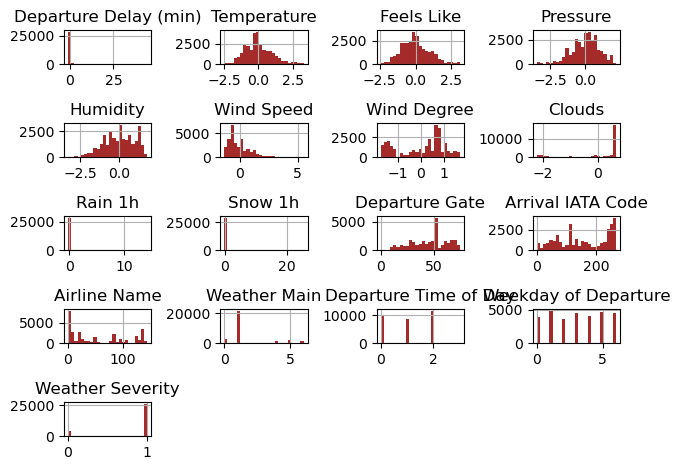

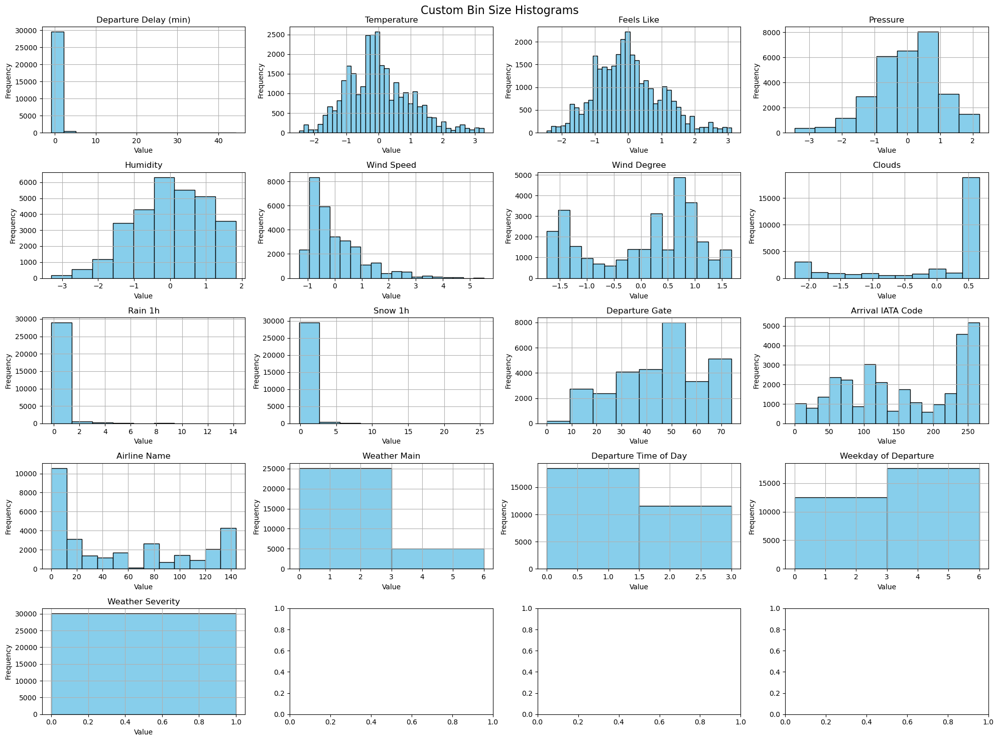

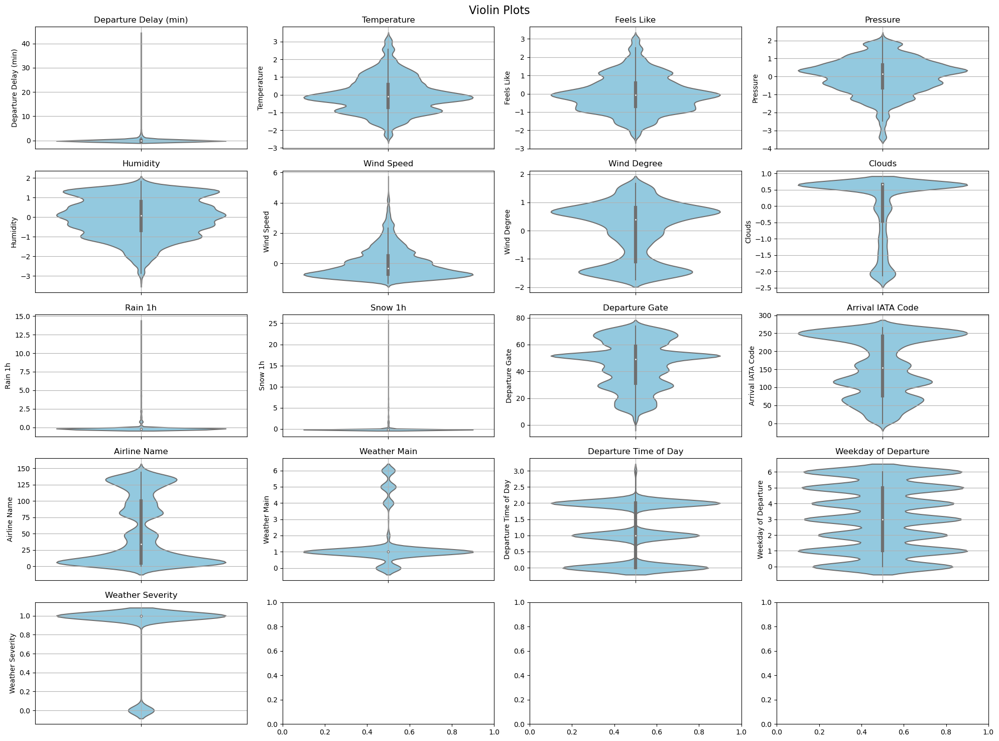

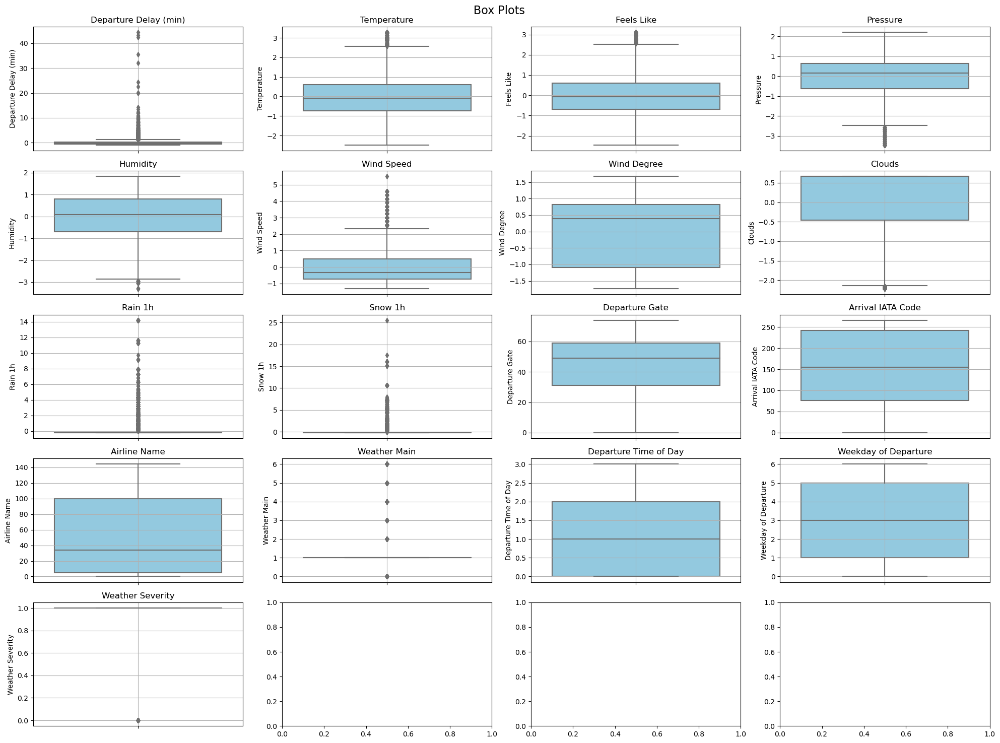

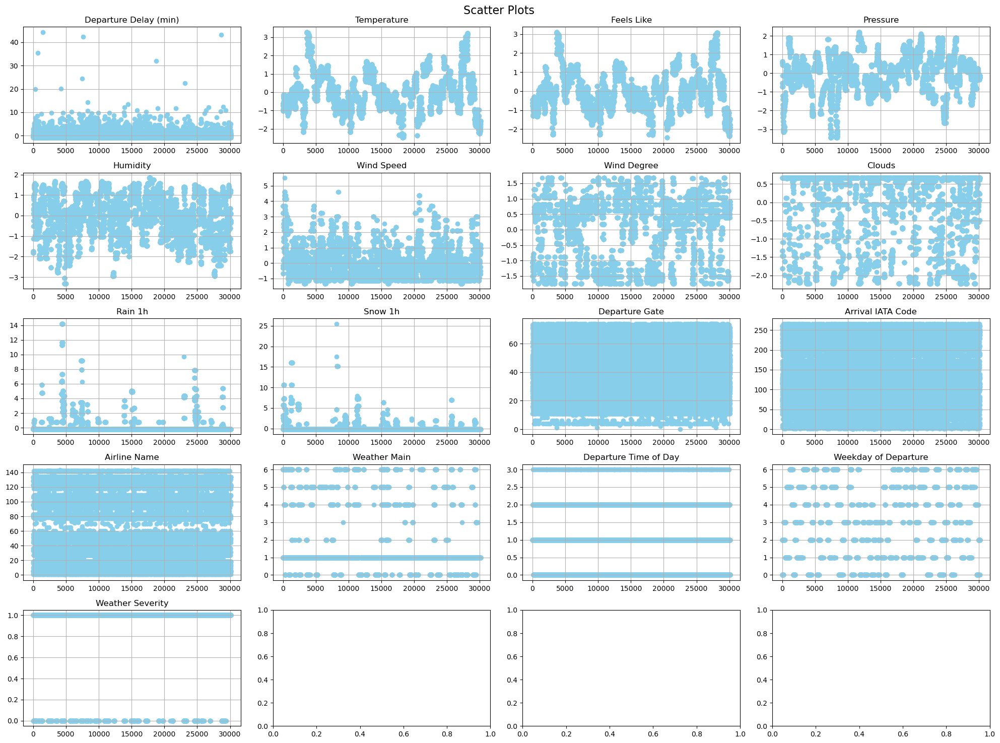

In [19]:
def visualize_data(df):
    # Simple Histogram on 20x15 Figure to show the distribution of the data
    plt.figure(figsize=(30, 25))
    plt.suptitle('Simple Histogram with Fixed Bin Size (bins=25)', fontsize=16)
    df.hist(bins=25, color='brown')
    plt.tight_layout()  # Adjust layout
    plt.show()

    # Custom Bin Size Histograms
    bin_size_dict = {col: max(1, int(np.sqrt(df[col].nunique()))) for col in df.columns}
    fig, axes = plt.subplots(5, 4, figsize=(20, 15))
    plt.suptitle('Custom Bin Size Histograms', fontsize=16)
    axes = axes.flatten()

    for i, (col, ax) in enumerate(zip(df.columns, axes)):
        ax.hist(df[col], bins=bin_size_dict[col], color='skyblue', edgecolor='black')
        ax.set_title(col)
        ax.grid(True)
        ax.set_ylabel('Frequency')
        ax.set_xlabel('Value')

    plt.tight_layout()  # Adjust layout
    plt.show()

    # Violin Plots
    fig, axes = plt.subplots(5, 4, figsize=(20, 15))
    plt.suptitle('Violin Plots', fontsize=16)
    axes = axes.flatten()

    for i, (col, ax) in enumerate(zip(df.columns, axes)):
        sns.violinplot(data=df, y=col, ax=ax, color='skyblue')
        ax.set_title(col)
        ax.grid(True)

    plt.tight_layout()  # Adjust layout
    plt.show()

    # Box Plots
    fig, axes = plt.subplots(5, 4, figsize=(20, 15))
    plt.suptitle('Box Plots', fontsize=16)
    axes = axes.flatten()

    for i, (col, ax) in enumerate(zip(df.columns, axes)):
        sns.boxplot(data=df, y=col, ax=ax, color='skyblue')
        ax.set_title(col)
        ax.grid(True)

    plt.tight_layout()  # Adjust layout
    plt.show()

    # Scatter Plots
    fig, axes = plt.subplots(5, 4, figsize=(20, 15))
    plt.suptitle('Scatter Plots', fontsize=16)
    axes = axes.flatten()

    for i, (col, ax) in enumerate(zip(df.columns, axes)):
        ax.scatter(df.index, df[col], color='skyblue')
        ax.set_title(col)
        ax.grid(True)

    plt.tight_layout()  # Adjust layout
    plt.show()

visualize_data(df)

### 2.2 Feature Relationships

KeyboardInterrupt: 

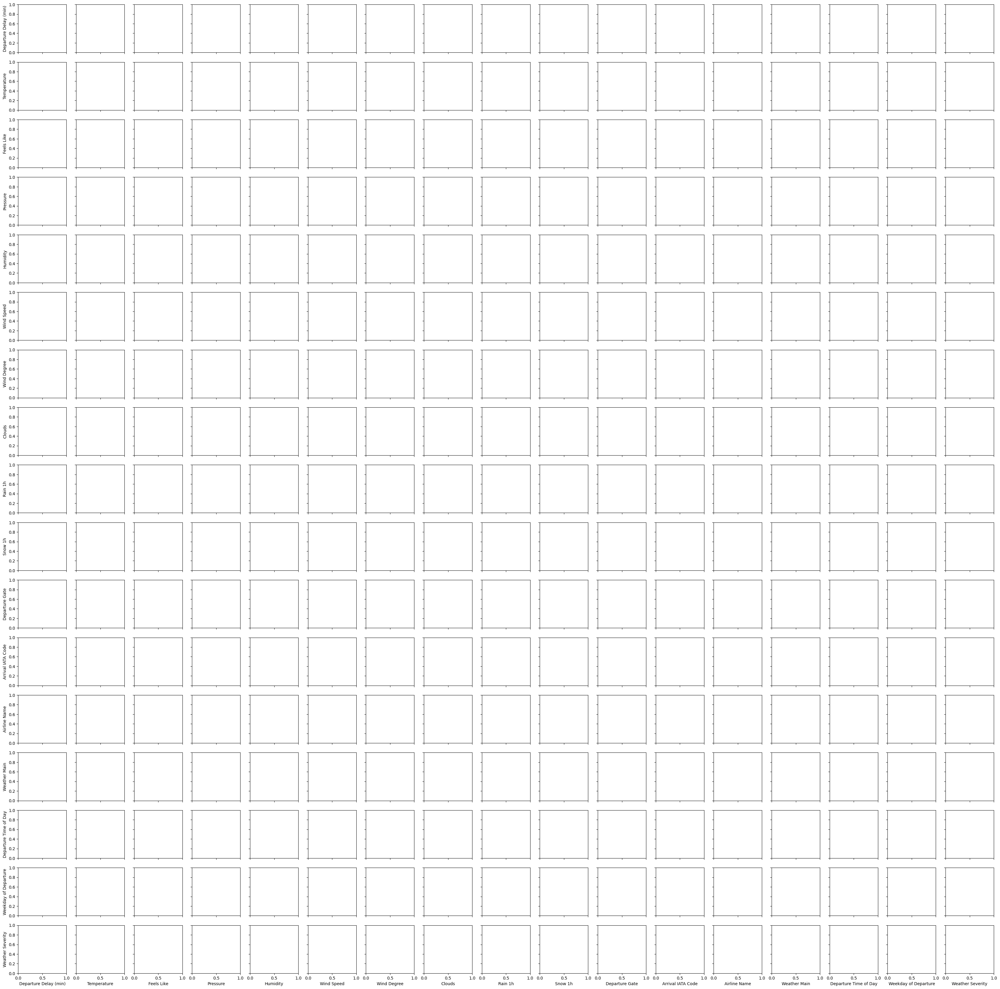

In [21]:

def analyze_relationships(df):
    # Pairplot to visualize relationships among features
    sns.pairplot(df)
    plt.title('Pairplot of Features')
    plt.show()

    # Correlation heatmap to show correlation among features
    corr = df.corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
    plt.title('Correlation Heatmap of Features')
    plt.show()

    # Scatter plots of each feature against the target variable
    target = 'Departure Delay (min)'
    features = [col for col in df.columns if col != target]
    fig, axes = plt.subplots(len(features), 1, figsize=(10, 8*len(features)))
    for i, feature in enumerate(features):
        sns.scatterplot(x=df[feature], y=df[target], ax=axes[i])
        axes[i].set_title(f'{feature} vs {target}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel(target)
    plt.tight_layout()
    plt.show()

analyze_relationships(df)

## 3. EDA with YDataProfiling

### 3.1 YDataProfiling and Saving Report to HTML

In [7]:
processed_report = ProfileReport(df, title='Pandas Profiling Report: Processed Dataset', explorative=True)

# save the report to html file
processed_report.to_file("processed_report.html")


Summarize dataset:  79%|███████▉  | 19/24 [00:01<00:00,  9.38it/s, Calculate auto correlation]             c:\Users\seanc\anaconda3\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  discretized_df.loc[:, column] = self._discretize_column(
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 30.36it/s]


### 3.2 Display YDataProfiling Report in Notebook

In [15]:

# show the report in the notebook
processed_report.to_notebook_iframe()